In [17]:
import sys
import PIL
import time
import copy
import torch
import pathlib
import datetime
import torchvision
from PIL import Image
from tqdm import tqdm
import torch.nn as nn
import torch.optim as optim
from model.model import ResNetSR
from model.unet import UNet
from torch.optim import lr_scheduler
from matplotlib import pyplot as plt
from torchvision import datasets, models, transforms
from custom_dataset import DIV2K_Dataset, DIV2K_Square_Dataset

In [9]:
DIV2K_path = pathlib.Path('../datasets/DIV2K').absolute()
DIV2K_path

PosixPath('/home/hacker/Documents/Super-Resolution/src/../datasets/DIV2K')

In [10]:
DIV2K_train_HR_crop_600 = DIV2K_path/'custom'/'DIV2K_train_HR_crop_600'
DIV2K_train_LR_600_150 = DIV2K_path/'custom'/'DIV2K_train_LR_600_150'
DIV2K_valid_HR_crop_600 = DIV2K_path/'custom'/'DIV2K_valid_HR_crop_600'
DIV2K_valid_LR_600_150 = DIV2K_path/'custom'/'DIV2K_valid_LR_600_150'

In [11]:
train_LR, train_HR = DIV2K_train_LR_600_150, DIV2K_train_HR_crop_600
valid_LR, valid_HR = DIV2K_valid_LR_600_150, DIV2K_valid_HR_crop_600

In [12]:
datasets = {
    'train': DIV2K_Square_Dataset(input_dir=train_LR, target_dir=train_HR, transform=transforms.ToTensor()),
    'val': DIV2K_Square_Dataset(input_dir=valid_LR, target_dir=valid_HR, transform=transforms.ToTensor())
}
dataloaders = {x: torch.utils.data.DataLoader(datasets[x], batch_size=4, shuffle=True, num_workers=4) for x in ['train', 'val']}
dataset_sizes = {x: len(datasets[x]) for x in ['train', 'val']}

In [13]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

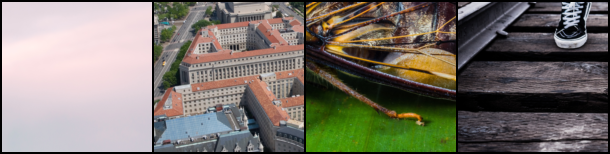

In [14]:
# Low Res
inputs, target = next(iter(dataloaders['train']))
transforms.ToPILImage()(torchvision.utils.make_grid(inputs))

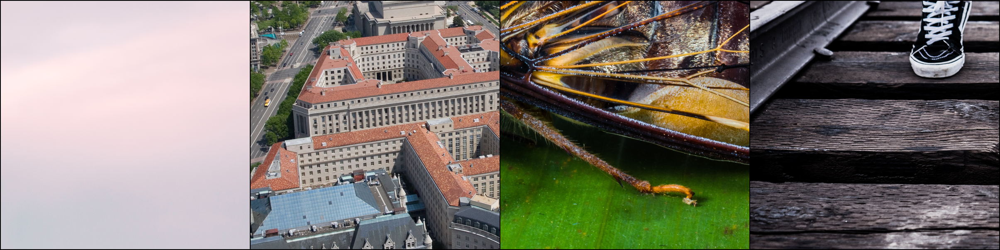

In [15]:
# High Res
transforms.ToPILImage()(torchvision.utils.make_grid(target))

In [16]:
def format_time(elapsed):
    elapsed_rounded = int(round((elapsed)))
    return str(datetime.timedelta(seconds=elapsed_rounded))

In [10]:
model = UNet()
num_epochs = 50
criterion = nn.MSELoss()
optimizer = optim.SGD(model.parameters(), lr=0.001, momentum=0.9)
scheduler = lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

In [11]:
loss_values = []
model = model.to(device)
t_00 = time.time()
for epoch_i in range(0, num_epochs):
    print("")
    print('======================== Epoch {:} / {:} ========================'.format(epoch_i + 1, num_epochs))
    print('Training...')
    t0 = time.time()
    total_loss = 0
    model.train()
    for step, (inputs, labels) in enumerate(dataloaders['train']):
        if step % 20 == 0 and not step == 0:
            elapsed = time.time() - t0
            print('  Batch {:>5,}  of  {:>5,}.    Elapsed: {:}.'.format(step, len(dataloaders['train']), format_time(elapsed)))
        model.zero_grad()
        inputs = inputs.to(device)
        labels = labels.to(device)
        outputs = model(inputs)
        loss = criterion(outputs, labels) * inputs.shape[0]
        total_loss += loss
        loss.backward()
        optimizer.step()
        scheduler.step()
        total_loss += loss.item()
    avg_train_loss = total_loss / dataset_sizes['train']
    loss_values.append(avg_train_loss)
    print("")
    print("  Average training loss: {}".format(avg_train_loss))
    print("  Training epoch took: {:}".format(format_time(time.time() - t0)))
print("Total Training Time Taken: {:}".format(format_time(time.time() - t_00)))

ed: 0:00:07.
  Batch    80  of    200.    Elapsed: 0:00:09.
  Batch   100  of    200.    Elapsed: 0:00:11.
  Batch   120  of    200.    Elapsed: 0:00:13.
  Batch   140  of    200.    Elapsed: 0:00:15.
  Batch   160  of    200.    Elapsed: 0:00:17.
  Batch   180  of    200.    Elapsed: 0:00:19.

  Average training loss: 0.36480453610420227
  Training epoch took: 0:00:21

======================== Epoch 17 / 50 ========================
Training...
  Batch    20  of    200.    Elapsed: 0:00:02.
  Batch    40  of    200.    Elapsed: 0:00:04.
  Batch    60  of    200.    Elapsed: 0:00:06.
  Batch    80  of    200.    Elapsed: 0:00:08.
  Batch   100  of    200.    Elapsed: 0:00:11.
  Batch   120  of    200.    Elapsed: 0:00:13.
  Batch   140  of    200.    Elapsed: 0:00:15.
  Batch   160  of    200.    Elapsed: 0:00:17.
  Batch   180  of    200.    Elapsed: 0:00:19.

  Average training loss: 0.36820048093795776
  Training epoch took: 0:00:21

======================== Epoch 18 / 50 ===========

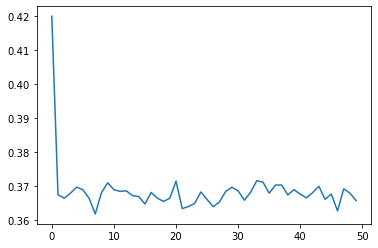

In [12]:
plt.plot(range(num_epochs), loss_values)

In [13]:
print("Running Validation...")
t0 = time.time()
model.eval()
eval_loss, eval_accuracy = 0, 0
with torch.no_grad():
    # Evaluate data for one epoch
    for step, (inputs, labels) in enumerate(dataloaders['val']):
        inputs, labels = inputs.to(device), labels.to(device)
        outputs = model(inputs)
        loss = criterion(outputs, labels) * inputs.shape[0]
        eval_loss += loss.item()
print("  Total Validation Loss: {0:.2f}".format(eval_loss))
print("  Avg validation Loss: {0:.4f}".format(eval_loss / dataset_sizes['val']))
print("  Validation took: {:}".format(format_time(time.time() - t0)))
print("\nTraining complete!")

Running Validation...
  Total Validation Loss: 17.05
  Avg validation Loss: 0.1705
  Validation took: 0:00:01

Training complete!


[tensor(0.4053, device='cuda:0', grad_fn=<DivBackward0>),
 tensor(0.0286, device='cuda:0', grad_fn=<DivBackward0>),
 tensor(0.0197, device='cuda:0', grad_fn=<DivBackward0>),
 tensor(0.0181, device='cuda:0', grad_fn=<DivBackward0>),
 tensor(0.0168, device='cuda:0', grad_fn=<DivBackward0>),
 tensor(0.0153, device='cuda:0', grad_fn=<DivBackward0>),
 tensor(0.0156, device='cuda:0', grad_fn=<DivBackward0>),
 tensor(0.0148, device='cuda:0', grad_fn=<DivBackward0>),
 tensor(0.0140, device='cuda:0', grad_fn=<DivBackward0>),
 tensor(0.0137, device='cuda:0', grad_fn=<DivBackward0>),
 tensor(0.0146, device='cuda:0', grad_fn=<DivBackward0>),
 tensor(0.0142, device='cuda:0', grad_fn=<DivBackward0>),
 tensor(0.0144, device='cuda:0', grad_fn=<DivBackward0>),
 tensor(0.0137, device='cuda:0', grad_fn=<DivBackward0>),
 tensor(0.0123, device='cuda:0', grad_fn=<DivBackward0>),
 tensor(0.0133, device='cuda:0', grad_fn=<DivBackward0>),
 tensor(0.0139, device='cuda:0', grad_fn=<DivBackward0>),
 tensor(0.0139

In [14]:
inputs, labels = next(iter(dataloaders['train']))
with torch.no_grad():
    inputs, labels = inputs.to(device), labels.to(device)
    outputs = model(inputs)

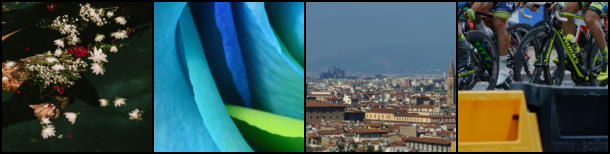

In [15]:
transforms.ToPILImage()(torchvision.utils.make_grid(inputs))

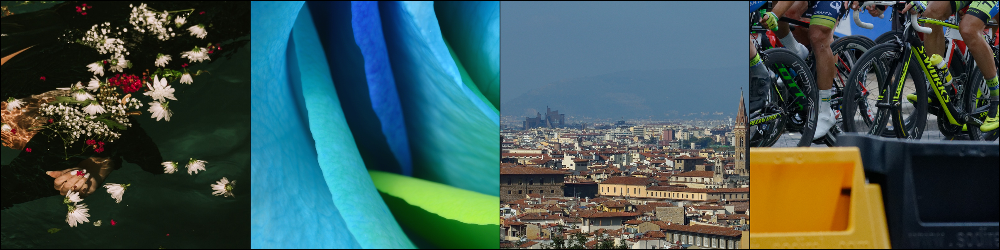

In [16]:
transforms.ToPILImage()(torchvision.utils.make_grid(labels))

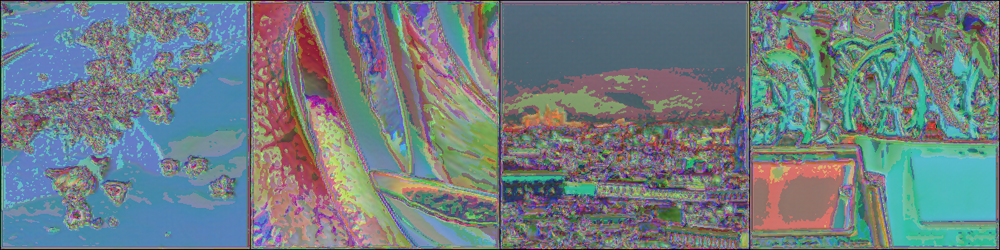

In [17]:
transforms.ToPILImage()(torchvision.utils.make_grid(outputs))

In [22]:
img_id = 0

In [23]:
# transforms.ToPILImage()(inputs[img_id])

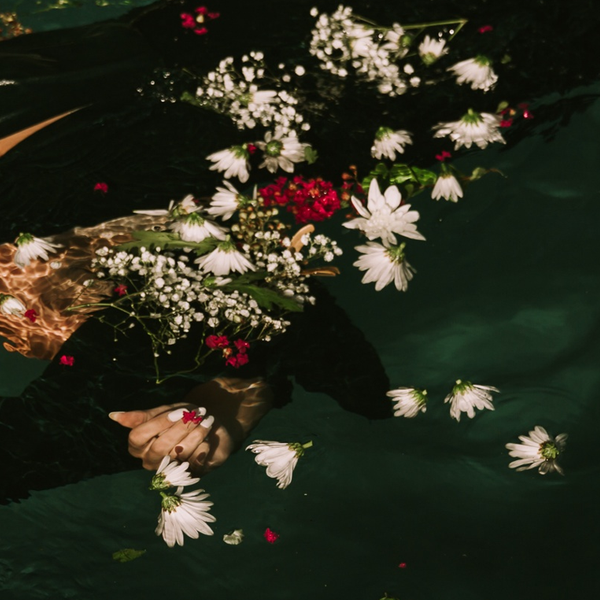

In [24]:
transforms.ToPILImage()(labels[img_id])

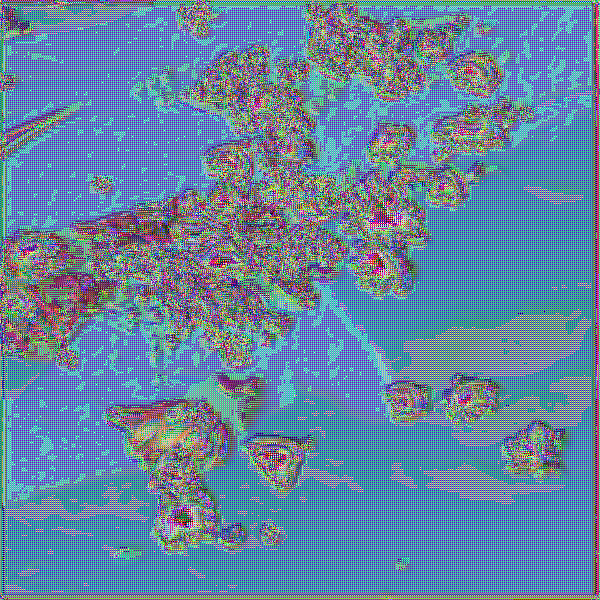

In [25]:
transforms.ToPILImage()(outputs[img_id])